In [6]:
# IMPORTANT: RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES,
# THEN FEEL FREE TO DELETE THIS CELL.
# NOTE: THIS NOTEBOOK ENVIRONMENT DIFFERS FROM KAGGLE'S PYTHON
# ENVIRONMENT SO THERE MAY BE MISSING LIBRARIES USED BY YOUR
# NOTEBOOK.
import kagglehub
faizalkarim_flood_area_segmentation_path = kagglehub.dataset_download('faizalkarim/flood-area-segmentation')

print('Data source import complete.')


100%|██████████| 107M/107M [00:00<00:00, 113MB/s] 

Extracting files...


Data source import complete.


# **Import Needed Modules**

In [7]:
# import system libs
import os
import time
import glob
import shutil

# import data handling tools
import cv2
import PIL
import numpy as np
import pandas as pd
import seaborn as sns
sns.set_style('darkgrid')
import matplotlib.pyplot as plt

# import Deep learning Libraries
import tensorflow as tf
from tensorflow import keras
import tensorflow.image as tfi
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Model, load_model
from keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.layers import Conv2D,  MaxPool2D, UpSampling2D, concatenate, Activation
from tensorflow.keras.layers import Layer, Input, Add, Multiply, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam, Adamax

# Ignore Warnings
import warnings
warnings.filterwarnings("ignore")

print ('modules loaded')

modules loaded


# **Create Needed Functions**

### **Function to create data**

In [8]:
def create_data(data_dir):
    image_paths = []
    mask_paths = []

    folds = sorted(os.listdir(data_dir))
    for fold in folds:
        foldpath = os.path.join(data_dir, fold)
        if fold in ['image', 'Image', 'images', 'Images', 'IMAGES']:
            images = sorted(os.listdir(foldpath))
            for image in images:
                fpath = os.path.join(foldpath, image)
                image_paths.append(fpath)

        elif fold in ['mask', 'Mask', 'masks', 'Masks', 'MASKS']:
            masks = sorted(os.listdir(foldpath))
            for mask in masks:
                fpath = os.path.join(foldpath, mask)
                mask_paths.append(fpath)
        else:
            continue

    return image_paths, mask_paths

### **Functions to read images**

In [9]:
# function to read an image
def load_image(image, SIZE):
    return np.round(tfi.resize(img_to_array(load_img(image)) / 255., (SIZE, SIZE)), 4)

# function to read multiple images
def load_images(image_paths, SIZE, mask=False, trim=None):
    if trim is not None:
        image_paths = image_paths[:trim]

    if mask:
        images = np.zeros(shape=(len(image_paths), SIZE, SIZE, 1))
    else:
        images = np.zeros(shape=(len(image_paths), SIZE, SIZE, 3))

    for i, image in enumerate(image_paths):
        img = load_image(image, SIZE)
        if mask:
            images[i] = img[:, :, :1]
        else:
            images[i] = img

    return images

### **Function to display data sample**

In [10]:
def show_image(image, title=None, cmap=None, alpha=1):
    plt.imshow(image, cmap=cmap, alpha=alpha)
    if title is not None:
        plt.title(title)
    plt.axis('off')

def show_mask(image, mask, cmap=None, alpha=0.4):
    plt.imshow(image)
    plt.imshow(tf.squeeze(mask), cmap=cmap, alpha=alpha)
    plt.axis('off')

def show_images(imgs, msks):
    plt.figure(figsize=(13,8))

    for i in range(15):
        plt.subplot(3,5,i+1)
        id = np.random.randint(len(imgs))
        show_mask(imgs[id], msks[id], cmap='binary')

    plt.tight_layout()
    plt.show()

### **Encoder**

In [11]:
class EncoderBlock(Layer):

    def __init__(self, filters, rate, pooling=True, **kwargs):
        super(EncoderBlock, self).__init__(**kwargs)

        self.filters = filters
        self.rate = rate
        self.pooling = pooling

        self.c1 = Conv2D(filters, kernel_size=3, strides=1, padding='same', activation='relu', kernel_initializer='he_normal')
        self.drop = Dropout(rate)
        self.c2 = Conv2D(filters, kernel_size=3, strides=1, padding='same', activation='relu', kernel_initializer='he_normal')
        self.pool = MaxPool2D()

    def call(self, X):
        x = self.c1(X)
        x = self.drop(x)
        x = self.c2(x)
        if self.pooling:
            y = self.pool(x)
            return y, x
        else:
            return x

    def get_config(self):
        base_config = super().get_config()
        return {
            **base_config,
            "filters":self.filters,
            'rate':self.rate,
            'pooling':self.pooling
        }

### **Decoder**

In [12]:
class DecoderBlock(Layer):

    def __init__(self, filters, rate, **kwargs):
        super(DecoderBlock, self).__init__(**kwargs)

        self.filters = filters
        self.rate = rate

        self.up = UpSampling2D()
        self.net = EncoderBlock(filters, rate, pooling=False)

    def call(self, X):
        X, skip_X = X
        x = self.up(X)
        c_ = concatenate([x, skip_X])
        x = self.net(c_)
        return x

    def get_config(self):
        base_config = super().get_config()
        return {
            **base_config,
            "filters":self.filters,
            'rate':self.rate,
        }

### **AttentionGate**

In [13]:
class AttentionGate(Layer):

    def __init__(self, filters, bn, **kwargs):
        super(AttentionGate, self).__init__(**kwargs)

        self.filters = filters
        self.bn = bn

        self.normal = Conv2D(filters, kernel_size=3, padding='same', activation='relu', kernel_initializer='he_normal')
        self.down = Conv2D(filters, kernel_size=3, strides=2, padding='same', activation='relu', kernel_initializer='he_normal')
        self.learn = Conv2D(1, kernel_size=1, padding='same', activation='sigmoid')
        self.resample = UpSampling2D()
        self.BN = BatchNormalization()

    def call(self, X):
        X, skip_X = X

        x = self.normal(X)
        skip = self.down(skip_X)
        x = Add()([x, skip])
        x = self.learn(x)
        x = self.resample(x)
        f = Multiply()([x, skip_X])
        if self.bn:
            return self.BN(f)
        else:
            return f
        # return f

    def get_config(self):
        base_config = super().get_config()
        return {
            **base_config,
            "filters":self.filters,
            "bn":self.bn
        }

### **Function to plot training history**

In [14]:
def plot_training(hist):
    '''
    This function take training model and plot history of accuracy and losses with the best epoch in both of them.
    '''

    # Define needed variables
    tr_acc = hist.history['accuracy']
    tr_loss = hist.history['loss']
    val_acc = hist.history['val_accuracy']
    val_loss = hist.history['val_loss']
    index_loss = np.argmin(val_loss)
    val_lowest = val_loss[index_loss]
    index_acc = np.argmax(val_acc)
    acc_highest = val_acc[index_acc]
    Epochs = [i+1 for i in range(len(tr_acc))]
    loss_label = f'best epoch= {str(index_loss + 1)}'
    acc_label = f'best epoch= {str(index_acc + 1)}'

    # Plot training history
    plt.figure(figsize= (20, 8))
    plt.style.use('fivethirtyeight')

    plt.subplot(1, 2, 1)
    plt.plot(Epochs, tr_loss, 'r', label= 'Training loss')
    plt.plot(Epochs, val_loss, 'g', label= 'Validation loss')
    plt.scatter(index_loss + 1, val_lowest, s= 150, c= 'blue', label= loss_label)
    plt.title('Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(Epochs, tr_acc, 'r', label= 'Training Accuracy')
    plt.plot(Epochs, val_acc, 'g', label= 'Validation Accuracy')
    plt.scatter(index_acc + 1 , acc_highest, s= 150, c= 'blue', label= acc_label)
    plt.title('Training and Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    plt.tight_layout
    plt.show()

# **Model Structure**

### **Get Data**

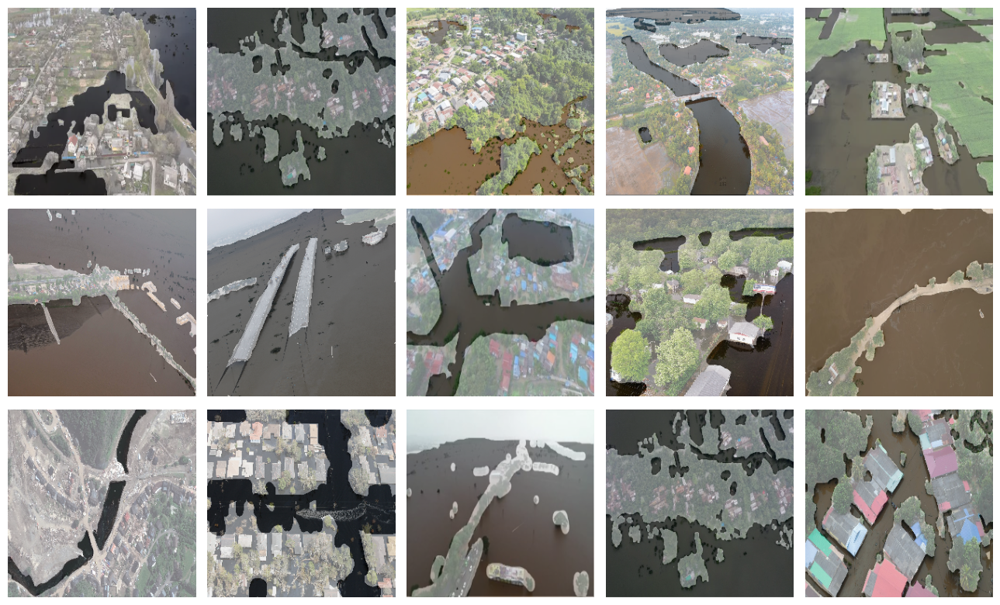

In [15]:
SIZE = 256

# get data
data_dir = '/kaggle/input/flood-area-segmentation'
image_paths, mask_paths = create_data(data_dir)

# load images and masks
imgs = load_images(image_paths, SIZE)
msks = load_images(mask_paths, SIZE, mask=True)

# show sample
show_images(imgs, msks)

### **Create Model**

In [16]:
# Inputs
input_layer = Input(shape= imgs.shape[-3:])

# Encoder
p1, c1 = EncoderBlock(32, 0.1, name="Encoder1")(input_layer)
p2, c2 = EncoderBlock(64, 0.1, name="Encoder2")(p1)
p3, c3 = EncoderBlock(128, 0.2, name="Encoder3")(p2)
p4, c4 = EncoderBlock(256, 0.2, name="Encoder4")(p3)

# Encoding
encoding = EncoderBlock(512, 0.3, pooling=False, name="Encoding")(p4)

# Attention + Decoder
a1 = AttentionGate(256, bn=True, name="Attention1")([encoding, c4])
d1 = DecoderBlock(256, 0.2, name="Decoder1")([encoding, a1])

a2 = AttentionGate(128, bn=True, name="Attention2")([d1, c3])
d2 = DecoderBlock(128, 0.2, name="Decoder2")([d1, a2])

a3 = AttentionGate(64, bn=True, name="Attention3")([d2, c2])
d3 = DecoderBlock(64, 0.1, name="Decoder3")([d2, a3])

a4 = AttentionGate(32, bn=True, name="Attention4")([d3, c1])
d4 = DecoderBlock(32,0.1, name="Decoder4")([d3, a4])

# Output
output_layer = Conv2D(1, kernel_size=1, activation='sigmoid', padding='same')(d4)

# Model
model = Model(inputs= [input_layer], outputs= [output_layer])

# Compile
model.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

# Summary
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Encoder1            │ [(None, 128, 128, │     10,144 │ input_layer[0][0] │
│ (EncoderBlock)      │ 32), (None, 256,  │            │                   │
│                     │ 256, 32)]         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Encoder2            │ [(None, 64, 64,   │     55,424 │ Encoder1[0][0]    │
│ (EncoderBlock)      │ 64), (None, 128,  │            │                   │
│                     │ 128, 64)]         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Encoder3            │ [(None, 32, 32,   │    221,440 │ Encoder2[0][0]    │
│ (EncoderBlock)      │ 128), (None, 64,  │            │                   │
│                     │ 64, 128)]         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Encoder4            │ [(None, 16, 16,   │    885,248 │ Encoder3[0][0]    │
│ (EncoderBlock)      │ 256), (None, 32,  │            │                   │
│                     │ 32, 256)]         │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Encoding            │ (None, 16, 16,    │  3,539,968 │ Encoder4[0][0]    │
│ (EncoderBlock)      │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Attention1          │ (None, 32, 32,    │  1,771,265 │ Encoding[0][0],   │
│ (AttentionGate)     │ 256)              │            │ Encoder4[0][1]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Decoder1            │ (None, 32, 32,    │  2,359,808 │ Encoding[0][0],   │
│ (DecoderBlock)      │ 256)              │            │ Attention1[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Attention2          │ (None, 64, 64,    │    443,265 │ Decoder1[0][0],   │
│ (AttentionGate)     │ 128)              │            │ Encoder3[0][1]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Decoder2            │ (None, 64, 64,    │    590,080 │ Decoder1[0][0],   │
│ (DecoderBlock)      │ 128)              │            │ Attention2[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Attention3          │ (None, 128, 128,  │    111,041 │ Decoder2[0][0],   │
│ (AttentionGate)     │ 64)               │            │ Encoder2[0][1]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Decoder3            │ (None, 128, 128,  │    147,584 │ Decoder2[0][0],   │
│ (DecoderBlock)      │ 64)               │            │ Attention3[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Attention4          │ (None, 256, 256,  │     27,873 │ Decoder3[0][0],   │
│ (AttentionGate)     │ 32)               │            │ Encoder1[0][1]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Decoder4            │ (None, 256, 256,  │     36,928 │ Decoder3[0][0],   │
│ (DecoderBlock)      │ 32)               │            │ Attention4[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_30 (Conv2D)  │ (None, 256, 256,  │         33 │ Decoder4[0][0]    │
│                     │ 1)                │            │                   │
└─────────────────────┴───────────────────┴────────────┴─────────────────

 Total params: 10,200,101 (38.91 MB)

 Trainable params: 10,199,141 (38.91 MB)

 Non-trainable params: 960 (3.75 KB)

In [17]:
batch_size = 40     # set batch size for training
epochs = 10         # number of all epochs in training
ask_epoch = 5		    # number of epochs to run before asking if you want to halt training

from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

callbacks = [
    ModelCheckpoint("flood_segmentation_unet_best.keras", save_best_only=True, monitor='val_loss', verbose=1),
    EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True, verbose=1)
]

### **Train Model**

In [18]:
# Config Training
SPE = len(imgs)//batch_size

# Training
history = model.fit(
    imgs, msks,
    validation_split=0.2,
    epochs=epochs,
    verbose=1,
    steps_per_epoch=SPE,
    batch_size=batch_size
)

Epoch 1/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 705s 96s/step - accuracy: 0.4968 - loss: 4.0764 - val_accuracy: 0.6089 - val_loss: 0.6897
Epoch 2/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 775s 102s/step - accuracy: 0.6069 - loss: 0.6320 - val_accuracy: 0.7376 - val_loss: 0.6419
Epoch 3/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 741s 102s/step - accuracy: 0.7309 - loss: 0.5420 - val_accuracy: 0.3408 - val_loss: 0.7251
Epoch 4/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 681s 95s/step - accuracy: 0.7494 - loss: 0.5077 - val_accuracy: 0.6389 - val_loss: 0.6372
Epoch 5/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 682s 95s/step - accuracy: 0.7767 - loss: 0.4562 - val_accuracy: 0.3808 - val_loss: 0.7065
Epoch 6/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 727s 103s/step - accuracy: 0.7823 - loss: 0.4525 - val_accuracy: 0.5059 - val_loss: 0.6696
Epoch 7/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 738s 102s/step - accuracy: 0.7867 - loss: 0.4425 - val_accuracy: 0.4347 - val_loss: 0.6854
Epoch 8/10
7/7 ━━━━━━━━━━━━━━━━━━━━ 743s 102s/step - accuracy: 0.8031 - loss: 0.4181 - val_accuracy: 0.4908 - val_

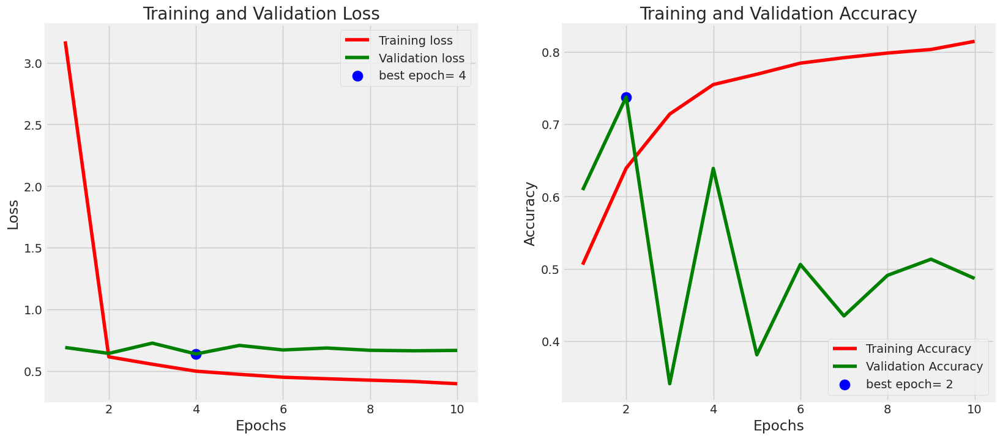

In [19]:
plot_training(history)

# **Evaluation**

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 627ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 634ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 620ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 625ms/step


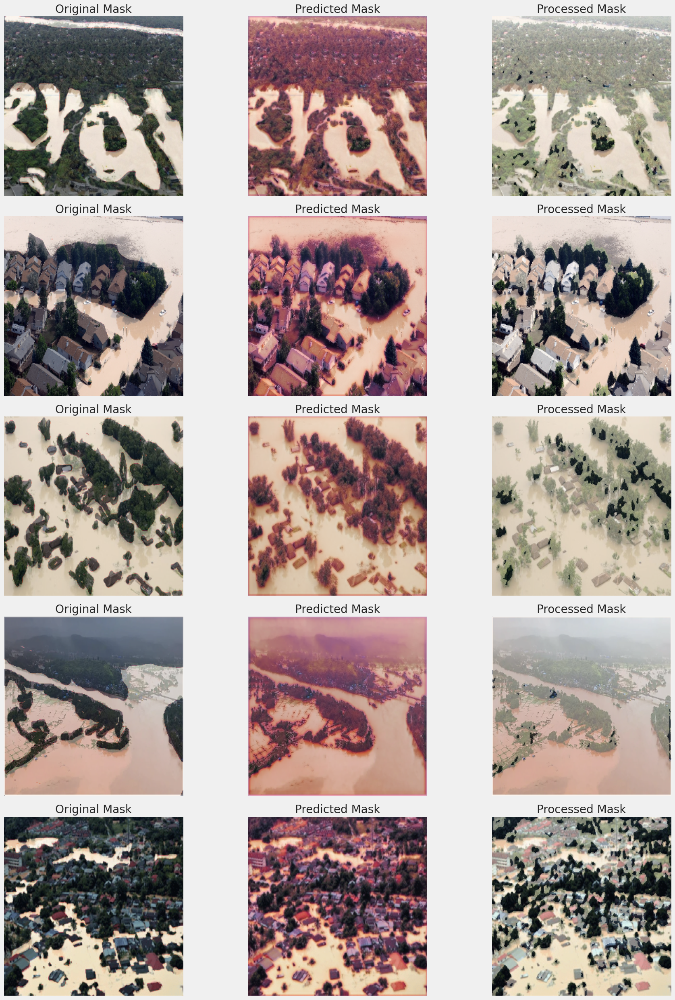

In [20]:
plt.figure(figsize=(20,25))
n=0
for i in range(1,(5*3)+1):
    plt.subplot(5,3,i)
    if n==0:
        id = np.random.randint(len(imgs))
        image = imgs[id]
        mask = msks[id]
        pred_mask = model.predict(image[np.newaxis,...])

        plt.title("Original Mask")
        show_mask(image, mask)
        n+=1
    elif n==1:
        plt.title("Predicted Mask")
        show_mask(image, pred_mask)
        n+=1
    elif n==2:
        pred_mask = (pred_mask>0.5).astype('float')
        plt.title("Processed Mask")
        show_mask(image, pred_mask)
        n=0
plt.tight_layout()
plt.show()

## Thank You..
## If you found it a good notebook, pleas upvote it..

modules loaded


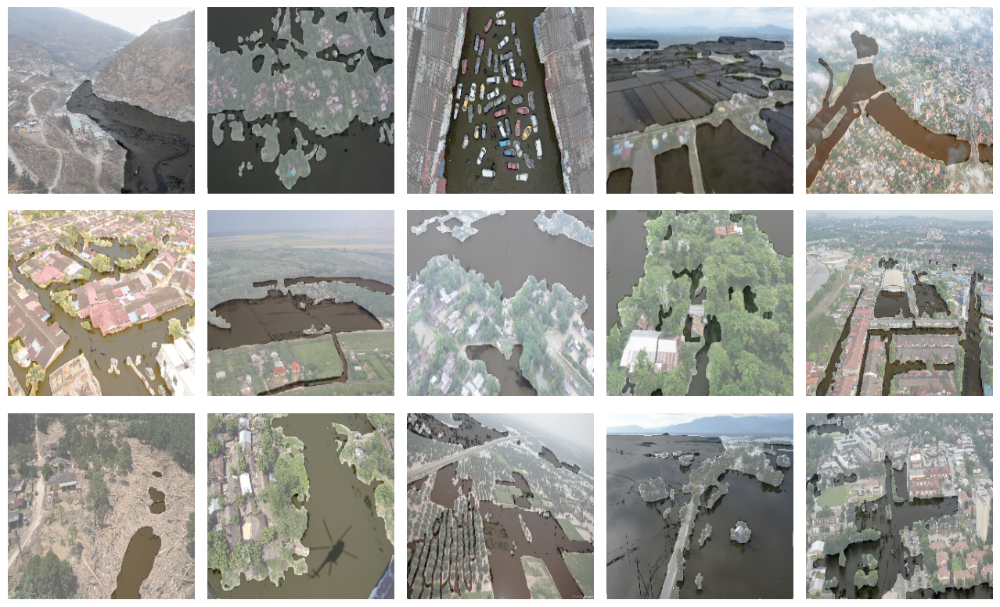

Model: "functional_8"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_8       │ (None, 256, 256,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_199 (Conv2D) │ (None, 128, 128,  │        896 │ input_layer_8[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        128 │ conv2d_199[0][0]  │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_147      │ (None, 128, 128,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_200 (Conv2D) │ (None, 128, 128,  │      9,248 │ activation_147[0… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        128 │ conv2d_200[0][0]  │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_148      │ (None, 128, 128,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_201 (Conv2D) │ (None, 128, 128,  │      9,248 │ activation_148[0… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        128 │ conv2d_201[0][0]  │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_87 (Add)        │ (None, 128, 128,  │          0 │ batch_normalizat… │
│                     │ 32)               │            │ activation_147[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_149      │ (None, 128, 128,  │          0 │ add_87[0][0]      │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_202 (Conv2D) │ (None, 128, 128,  │      9,248 │ activation_149[0… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        128 │ conv2d_202[0][0]  │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_150      │ (None, 128, 128,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_203 (Conv2D) │ (None, 128, 128,  │      9,248 │ activation_150[0… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 128, 128,  │        128 │ conv2d_203[0][0]  │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add_88 (Add)        │ (None, 128, 128,  │          0 │ batch_normalizat

 Total params: 1,354,369 (5.17 MB)

 Trainable params: 1,351,233 (5.15 MB)

 Non-trainable params: 3,136 (12.25 KB)

Epoch 1/25
15/18 ━━━━━━━━━━━━━━━━━━━━ 34s 12s/step - accuracy: 0.6190 - binary_crossentropy: 0.9085 - loss: 1.9442
Epoch 1: val_loss improved from inf to 2.00748, saving model to flood_segmentation_erfnet_best.keras
18/18 ━━━━━━━━━━━━━━━━━━━━ 219s 11s/step - accuracy: 0.6304 - binary_crossentropy: 0.8788 - loss: 1.9001 - val_accuracy: 0.4527 - val_binary_crossentropy: 0.7421 - val_loss: 2.0075
Epoch 2/25
15/18 ━━━━━━━━━━━━━━━━━━━━ 36s 12s/step - accuracy: 0.7971 - binary_crossentropy: 0.4755 - loss: 1.2374
Epoch 2: val_loss did not improve from 2.00748
18/18 ━━━━━━━━━━━━━━━━━━━━ 203s 11s/step - accuracy: 0.7966 - binary_crossentropy: 0.4821 - loss: 1.2386 - val_accuracy: 0.5141 - val_binary_crossentropy: 0.8385 - val_loss: 2.0393
Epoch 3/25
15/18 ━━━━━━━━━━━━━━━━━━━━ 35s 12s/step - accuracy: 0.8050 - binary_crossentropy: 0.4389 - loss: 1.1761
Epoch 3: val_loss did not improve from 2.00748
18/18 ━━━━━━━━━━━━━━━━━━━━ 258s 11s/step - accuracy: 0.8056 - binary_crossentropy: 0.4406 - loss: 

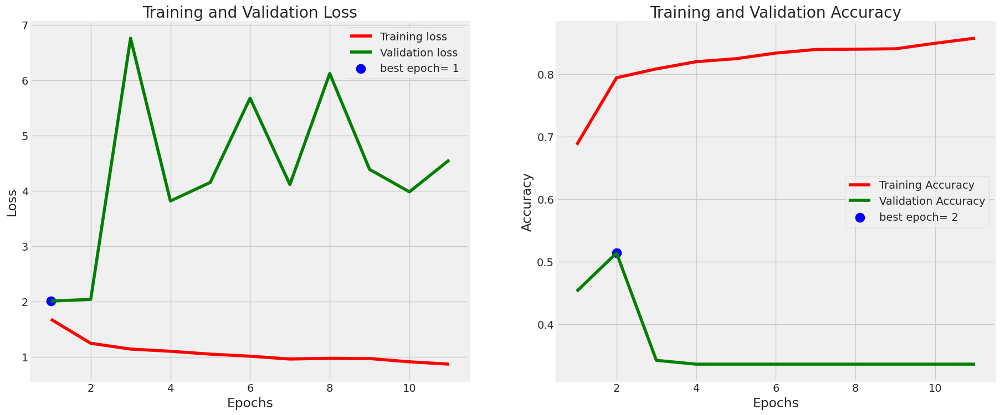

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 233ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 206ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 220ms/step


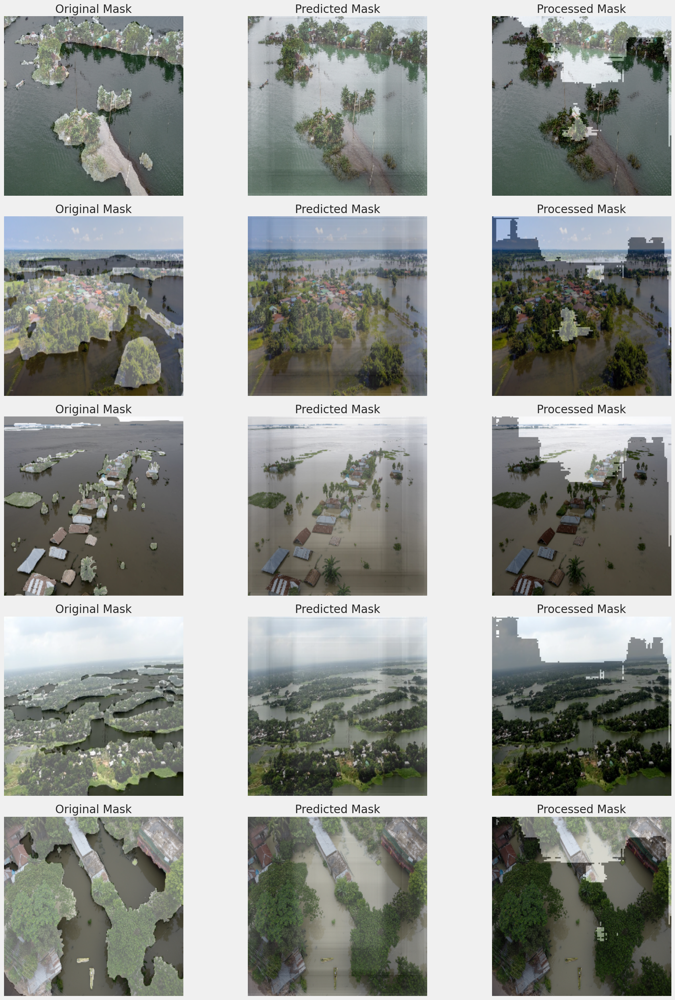

In [33]:
# import system libs
import os
import time
import glob
import shutil

# import data handling tools
import cv2
import PIL
import numpy as np
import pandas as pd
import seaborn as sns
sns.set_style('darkgrid')
import matplotlib.pyplot as plt

# import Deep learning Libraries
import tensorflow as tf
from tensorflow import keras
import tensorflow.image as tfi
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Model, load_model
from keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.layers import Conv2D,  MaxPool2D, UpSampling2D, concatenate, Activation
from tensorflow.keras.layers import Layer, Input, Add, Multiply, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam, Adamax
import tensorflow.keras.backend as K

# Ignore Warnings
import warnings
warnings.filterwarnings("ignore")

print ('modules loaded')

# --- Definição da função create_data ---
def create_data(data_dir):
    image_paths = []
    mask_paths = []

    folds = sorted(os.listdir(data_dir))
    for fold in folds:
        foldpath = os.path.join(data_dir, fold)
        if fold in ['image', 'Image', 'images', 'Images', 'IMAGES']:
            images = sorted(os.listdir(foldpath))
            for image in images:
                fpath = os.path.join(foldpath, image)
                image_paths.append(fpath)

        elif fold in ['mask', 'Mask', 'masks', 'Masks', 'MASKS']:
            masks = sorted(os.listdir(foldpath))
            for mask in masks:
                fpath = os.path.join(foldpath, mask)
                mask_paths.append(fpath)
        else:
            continue

    return image_paths, mask_paths

# --- Definição da função load_image ---
def load_image(image, SIZE):
    return np.round(tfi.resize(img_to_array(load_img(image)) / 255., (SIZE, SIZE)), 4)

# --- Definição da função load_images ---
def load_images(image_paths, SIZE, mask=False, trim=None):
    if trim is not None:
        image_paths = image_paths[:trim]

    channels = 1 if mask else 3
    images = np.zeros((len(image_paths), SIZE, SIZE, channels))
    for i, image in enumerate(image_paths):
        img = load_image(image, SIZE)
        images[i] = img[:, :, :1] if mask else img
    return images

# --- Definição da função show_image ---
def show_image(image, title=None, cmap=None, alpha=1):
    plt.imshow(image, cmap=cmap, alpha=alpha)
    if title is not None:
        plt.title(title)
    plt.axis('off')

# --- Definição da função show_mask ---
def show_mask(image, mask, cmap=None, alpha=0.4):
    plt.imshow(image)
    plt.imshow(tf.squeeze(mask), cmap=cmap, alpha=alpha)
    plt.axis('off')

# --- Definição da função show_images ---
def show_images(imgs, msks):
    plt.figure(figsize=(13,8))

    for i in range(15):
        plt.subplot(3,5,i+1)
        id = np.random.randint(len(imgs))
        show_mask(imgs[id], msks[id], cmap='binary')

    plt.tight_layout()
    plt.show()

# --- Funções de perda personalizadas ---
def dice_loss(y_true, y_pred):
    smooth = 1.
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return 1 - (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)

def jaccard_loss(y_true, y_pred):
    smooth = 1.
    intersection = K.sum(K.abs(y_true * y_pred), axis=[1,2,3])
    sum_ = K.sum(K.abs(y_true) + K.abs(y_pred), axis=[1,2,3])
    jac = (intersection + smooth) / (sum_ - intersection + smooth)
    return 1 - jac

def combined_loss(y_true, y_pred):
    # Calcula a média das perdas dice e jaccard ao longo do lote
    dice = tf.reduce_mean(dice_loss(y_true, y_pred))
    jaccard = tf.reduce_mean(jaccard_loss(y_true, y_pred))
    # Agora, 'dice' e 'jaccard' têm shape [1] (escalar)

    return keras.losses.binary_crossentropy(y_true, y_pred) + dice + jaccard
# --- Bloco Residual ERFNet ---
def residual_block(x, filters, dilation=1):
    shortcut = x
    x = Conv2D(filters, 3, padding='same', dilation_rate=dilation)(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)
    x = Conv2D(filters, 3, padding='same', dilation_rate=dilation)(x)
    x = BatchNormalization()(x)
    x = Add()([x, shortcut])
    x = Activation('relu')(x)
    return x

# --- Modelo ERFNet-like ---
def erfnet_like(input_shape):
    inputs = Input(shape=input_shape)
    x = Conv2D(32, 3, strides=2, padding='same')(inputs)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    for _ in range(3):
        x = residual_block(x, 32, dilation=1)

    x = Conv2D(64, 3, strides=2, padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    for _ in range(3):
        x = residual_block(x, 64, dilation=2)

    x = Conv2D(128, 3, strides=2, padding='same')(x)
    x = BatchNormalization()(x)
    x = Activation('relu')(x)

    for _ in range(3):
        x = residual_block(x, 128, dilation=4)

    # Decoder
    x = UpSampling2D()(x)
    x = Conv2D(64, 3, padding='same', activation='relu')(x)
    x = UpSampling2D()(x)
    x = Conv2D(32, 3, padding='same', activation='relu')(x)
    x = UpSampling2D()(x)
    outputs = Conv2D(1, 1, activation='sigmoid')(x)

    return Model(inputs, outputs)

# --- Definição da função plot_training ---
def plot_training(hist):
    '''
    This function take training model and plot history of accuracy and losses with the best epoch in both of them.
    '''

    # Define needed variables
    tr_acc = hist.history['accuracy']
    tr_loss = hist.history['loss']
    val_acc = hist.history['val_accuracy']
    val_loss = hist.history['val_loss']
    index_loss = np.argmin(val_loss)
    val_lowest = val_loss[index_loss]
    index_acc = np.argmax(val_acc)
    acc_highest = val_acc[index_acc]
    Epochs = [i+1 for i in range(len(tr_acc))]
    loss_label = f'best epoch= {str(index_loss + 1)}'
    acc_label = f'best epoch= {str(index_acc + 1)}'

    # Plot training history
    plt.figure(figsize= (20, 8))
    plt.style.use('fivethirtyeight')

    plt.subplot(1, 2, 1)
    plt.plot(Epochs, tr_loss, 'r', label= 'Training loss')
    plt.plot(Epochs, val_loss, 'g', label= 'Validation loss')
    plt.scatter(index_loss + 1, val_lowest, s= 150, c= 'blue', label= loss_label)
    plt.title('Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(Epochs, tr_acc, 'r', label= 'Training Accuracy')
    plt.plot(Epochs, val_acc, 'g', label= 'Validation Accuracy')
    plt.scatter(index_acc + 1 , acc_highest, s= 150, c= 'blue', label= acc_label)
    plt.title('Training and Validation Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    plt.tight_layout
    plt.show()

# --- Definição do tamanho da imagem ---
SIZE = 256

# --- Carregamento dos dados ---
data_dir = '/kaggle/input/flood-area-segmentation'
image_paths, mask_paths = create_data(data_dir)

# --- Carregamento das imagens e máscaras ---
imgs = load_images(image_paths, SIZE)
msks = load_images(mask_paths, SIZE, mask=True)

# --- Exibição de amostras ---
show_images(imgs, msks)

# --- Criação do Modelo ERFNet-like ---
model = erfnet_like((SIZE, SIZE, 3))

# --- Compilação do Modelo ---
model.compile(optimizer='adam',
              loss=combined_loss,
              metrics=['accuracy', 'binary_crossentropy']) # Binary Crossentropy como métrica

# --- Resumo do Modelo ---
model.summary()

# --- Definição dos parâmetros de treinamento ---
batch_size = 16     # Tamanho do lote para treinamento (ajustado para ERFNet)
epochs = 25         # Número total de épocas de treinamento (ajustado para ERFNet)
ask_epoch = 5       # Número de épocas para executar antes de perguntar se deseja interromper o treinamento

from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

callbacks = [
    ModelCheckpoint("flood_segmentation_erfnet_best.keras", save_best_only=True, monitor='val_loss', verbose=1),
    EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True, verbose=1)
]

# --- Configuração do número de passos por época ---
SPE = len(imgs)//batch_size

# --- Treinamento do Modelo ---
history = model.fit(
    imgs, msks,
    validation_split=0.2,
    epochs=epochs,
    verbose=1,
    steps_per_epoch=SPE,
    batch_size=batch_size,
    callbacks=callbacks # Usando callbacks padrão
)

# --- Plotagem do Histórico de Treinamento ---
plot_training(history)

# --- Visualização das Máscaras Preditas ---
plt.figure(figsize=(20,25))
n=0
for i in range(1,(5*3)+1):
    plt.subplot(5,3,i)
    if n==0:
        id = np.random.randint(len(imgs))
        image = imgs[id]
        mask = msks[id]
        pred_mask = model.predict(image[np.newaxis,...])

        plt.title("Original Mask")
        show_mask(image, mask, cmap='binary')
        n+=1
    elif n==1:
        plt.title("Predicted Mask")
        show_mask(image, pred_mask, cmap='binary')
        n+=1
    elif n==2:
        pred_mask = (pred_mask>0.5).astype('float')
        plt.title("Processed Mask")
        show_mask(image, pred_mask, cmap='binary')
        n=0
plt.tight_layout()
plt.show()